In [1]:
import random
import time
import astropy.io.fits as fits
import astropy.wcs as wcs
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.coordinates import match_coordinates_sky

In [2]:
datadir='../../doc/20170617_Stacking/maps/hsccats/'
def clean_hsc(df):
    start_time = time.time()
    ra_arr = np.array(df['ra'])*3600
    dec_arr = np.array(df['dec'])*3600
    gcls_arr = np.array(df['gcls'])
    Nnan_arr = np.array(df.isnull().sum(axis=1))
    idx_arr = np.arange(len(df))
    idx_use = []
    while len(idx_arr) > 0:
        idxi = idx_arr[0]
        sp = np.where((abs(ra_arr[0] - ra_arr)<0.2) & (abs(dec_arr[0] - dec_arr)<0.1) \
                      & (gcls_arr[0]==gcls_arr))[0]
        if len(sp)==0:
            sp = np.array([0])
        idxs = idx_arr[sp]
        ras = ra_arr[sp]
        decs = dec_arr[sp]
        decrads = decs/3600/180*np.pi
        ds = np.sqrt(((ras[0]-ras)*np.cos((decrads[0]+decrads)/2))**2 + (decs[0] - decs)**2)
        sp1 = np.where(ds<0.1)[0]
        idxs = idxs[sp1]
        if len(idxs) == 1:
            idx_use.append(int(idxs))
        else:
            idx_use.append(idxs[np.argmin(Nnan_arr[sp[sp1]])])

        idx_arr = np.delete(idx_arr,sp[sp1])
        ra_arr = np.delete(ra_arr,sp[sp1])
        dec_arr = np.delete(dec_arr,sp[sp1])
        Nnan_arr = np.delete(Nnan_arr,sp[sp1])
        gcls_arr = np.delete(gcls_arr,sp[sp1])

    print('cleaning df (%d -> %d), time = %.2f min'%(len(df),len(idx_use),(time.time()-start_time)/60))
    return df.iloc[idx_use]

def get_corrected_mag(df):
    Imag_arr = np.zeros(len(df))
    Hmag_arr = np.zeros(len(df))

    mags = df[['gmag_psf','rmag_psf','imag_psf','zmag_psf','ymag_psf']]
    mags = mags.replace(np.inf, np.nan)
    mags = mags.replace(-np.inf, np.nan)
    mags_exist = ~pd.isnull(mags)*1

    # if only have mag in one band
    sp1 = np.where(mags_exist.sum(axis=1)==1)[0]
    Imag_arr[sp1] = np.nanmean(np.array(mags)[sp1,:],axis=1)
    Hmag_arr[sp1] = np.nanmean(np.array(mags)[sp1,:],axis=1)

    # if more than two mag data
    sp2 = np.where(mags_exist.sum(axis=1)>1)[0]
    mags2 = np.array(mags)[sp2,:]
    mags2_exist = np.array(mags_exist)[sp2,:]
    wl1_vec = np.zeros(mags2.shape[0])
    wl2_vec = np.zeros(mags2.shape[0])
    wl_eff = [0.4754,0.6175,0.7711,0.8898,0.9762]
    mag1_vec = np.zeros(mags2.shape[0])
    mag2_vec = np.zeros(mags2.shape[0])
    for i in range(mags2.shape[0]):
        idxs = np.where(mags2_exist[i,:]==1)[0][-2:]
        wl1_vec[i] = wl_eff[idxs[0]]
        wl2_vec[i] = wl_eff[idxs[1]]
        mag1_vec[i] = mags2[i,idxs[0]]
        mag2_vec[i] = mags2[i,idxs[1]]

    # extrapolation
    Imag_arr[sp2] = (1.05 - wl1_vec) / (wl2_vec - wl1_vec) * (mag2_vec - mag1_vec) + mag1_vec
    Hmag_arr[sp2] = (1.79 - wl1_vec) / (wl2_vec - wl1_vec) * (mag2_vec - mag1_vec) + mag1_vec

    # set bright (extrapolated mag < 12) source to mag=12 
    Imag_arr[np.where(Imag_arr < 12)[0]] = 12
    Hmag_arr[np.where(Hmag_arr < 12)[0]] = 12

    df['I'] = Imag_arr
    df['H'] = Hmag_arr
    return df

# D_ELAISN1

NOTE - This field is overlap with CIBER SWIRE field

In [3]:
field = 'D_ELAISN1'
df = pd.read_csv(datadir + field + '_raw.csv')
df.rename(columns={"# ra": "ra"}, inplace = True)

In [4]:
# cleaning
df_clean = pd.DataFrame()
ra_lims = np.linspace(min(df['ra']),max(df['ra']),9)
dec_lims = np.linspace(min(df['dec']),max(df['dec']),9)
for ira,(ra1,ra2) in enumerate(zip(ra_lims[:-1],ra_lims[1:])):
    for idec,(dec1,dec2) in enumerate(zip(dec_lims[:-1],dec_lims[1:])):
        print("cleaning region (%d,%d)"%(ira,idec))
        dfs = df[(df['ra']>=ra1) & (df['ra']<ra2) & (df['dec']>=dec1) & (df['dec']<dec2)]
        dfs = clean_hsc(dfs)
        df_clean = df_clean.append(dfs)

cleaning region (0,0)
cleaning df (0 -> 0), time = 0.00 min
cleaning region (0,1)
cleaning df (0 -> 0), time = 0.00 min
cleaning region (0,2)
cleaning df (16403 -> 14842), time = 0.06 min
cleaning region (0,3)
cleaning df (125858 -> 92995), time = 1.75 min
cleaning region (0,4)
cleaning df (121756 -> 89972), time = 1.24 min
cleaning region (0,5)
cleaning df (11842 -> 10519), time = 0.04 min
cleaning region (0,6)
cleaning df (0 -> 0), time = 0.00 min
cleaning region (0,7)
cleaning df (0 -> 0), time = 0.00 min
cleaning region (1,0)
cleaning df (844 -> 692), time = 0.00 min
cleaning region (1,1)
cleaning df (37120 -> 23578), time = 0.12 min
cleaning region (1,2)
cleaning df (152116 -> 96333), time = 1.86 min
cleaning region (1,3)
cleaning df (286362 -> 163079), time = 6.53 min
cleaning region (1,4)
cleaning df (195117 -> 131828), time = 3.47 min
cleaning region (1,5)
cleaning df (73550 -> 62780), time = 0.66 min
cleaning region (1,6)
cleaning df (32117 -> 25825), time = 0.13 min
cleaning 

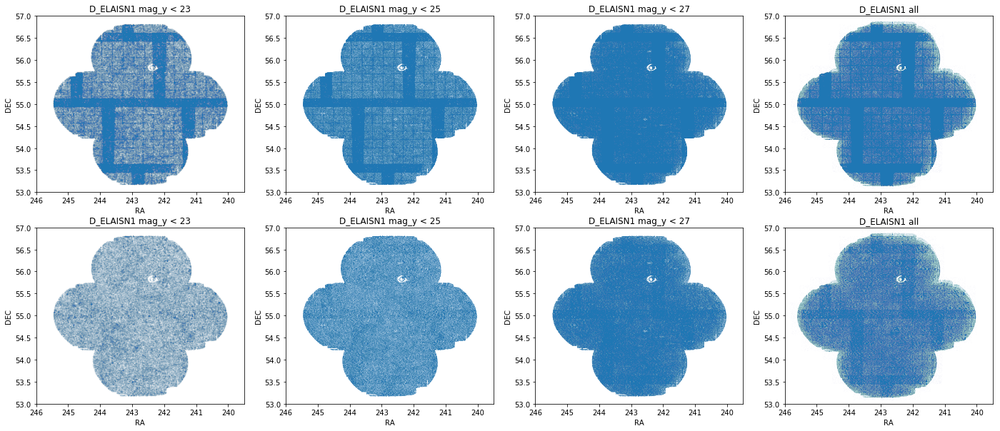

In [5]:
# plot cleaning map
fig, ax = plt.subplots(2,4,figsize=(24,10))

ax[0][0].scatter(df['ra'][df['ymag_psf']<23], df['dec'][df['ymag_psf']<23], s=0.0002)
ax[0][0].set_xlabel('RA')
ax[0][0].set_ylabel('DEC')
ax[0][0].set_title(field + ' mag_y < 23')
ax[0][0].set_xlim([239.5,246])
ax[0][0].set_ylim([53,57])
ax[0][0].invert_xaxis()

ax[0][1].scatter(df['ra'][df['ymag_psf']<25], df['dec'][df['ymag_psf']<25], s=0.0001)
ax[0][1].set_xlabel('RA')
ax[0][1].set_ylabel('DEC')
ax[0][1].set_title(field + ' mag_y < 25')
ax[0][1].set_xlim([239.5,246])
ax[0][1].set_ylim([53,57])
ax[0][1].invert_xaxis()

ax[0][2].scatter(df['ra'][df['ymag_psf']<27], df['dec'][df['ymag_psf']<27], s=0.00005)
ax[0][2].set_xlabel('RA')
ax[0][2].set_ylabel('DEC')
ax[0][2].set_title(field + ' mag_y < 27')
ax[0][2].set_xlim([239.5,246])
ax[0][2].set_ylim([53,57])
ax[0][2].invert_xaxis()

ax[0][3].scatter(df['ra'], df['dec'], s=0.00001)
ax[0][3].set_xlabel('RA')
ax[0][3].set_ylabel('DEC')
ax[0][3].set_title(field + ' all')
ax[0][3].set_xlim([239.5,246])
ax[0][3].set_ylim([53,57])
ax[0][3].invert_xaxis()

ax[1][0].scatter(df_clean['ra'][df_clean['ymag_psf']<23], df_clean['dec'][df_clean['ymag_psf']<23], s=0.0002)
ax[1][0].set_xlabel('RA')
ax[1][0].set_ylabel('DEC')
ax[1][0].set_title(field + ' mag_y < 23')
ax[1][0].set_xlim([239.5,246])
ax[1][0].set_ylim([53,57])
ax[1][0].invert_xaxis()

ax[1][1].scatter(df_clean['ra'][df_clean['ymag_psf']<25], df_clean['dec'][df_clean['ymag_psf']<25], s=0.0001)
ax[1][1].set_xlabel('RA')
ax[1][1].set_ylabel('DEC')
ax[1][1].set_title(field + ' mag_y < 25')
ax[1][1].set_xlim([239.5,246])
ax[1][1].set_ylim([53,57])
ax[1][1].invert_xaxis()

ax[1][2].scatter(df_clean['ra'][df_clean['ymag_psf']<27], df_clean['dec'][df_clean['ymag_psf']<27], s=0.00005)
ax[1][2].set_xlabel('RA')
ax[1][2].set_ylabel('DEC')
ax[1][2].set_title(field + ' mag_y < 27')
ax[1][2].set_xlim([239.5,246])
ax[1][2].set_ylim([53,57])
ax[1][2].invert_xaxis()

ax[1][3].scatter(df_clean['ra'], df_clean['dec'], s=0.00001)
ax[1][3].set_xlabel('RA')
ax[1][3].set_ylabel('DEC')
ax[1][3].set_title(field + ' all')
ax[1][3].set_xlim([239.5,246])
ax[1][3].set_ylim([53,57])
ax[1][3].invert_xaxis()
fig.savefig(field + '_map_clean', dpi = 256, bbox_inches='tight')

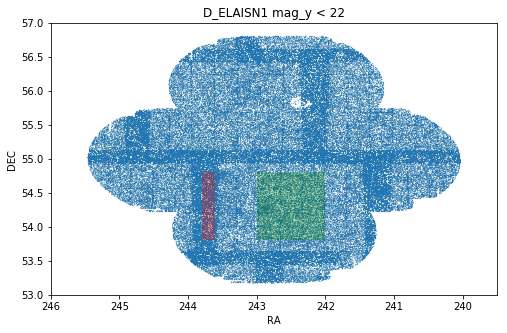

In [6]:
# choose regions for plotting mag func
fig, ax = plt.subplots(1,1,figsize=(8,5))
ax.scatter(df['ra'][df['ymag_psf']<22], df['dec'][df['ymag_psf']<22], s=0.005)
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.set_title(field + ' mag_y < 22')
ax.set_xlim([239.5,246])
ax.set_ylim([53,57])
ax.broken_barh([(242,1)],(53.8,1), facecolors='green', alpha=0.3)
ax.broken_barh([(243.6,0.2)],(53.8,1), facecolors='red', alpha=0.3)
ax.invert_xaxis()

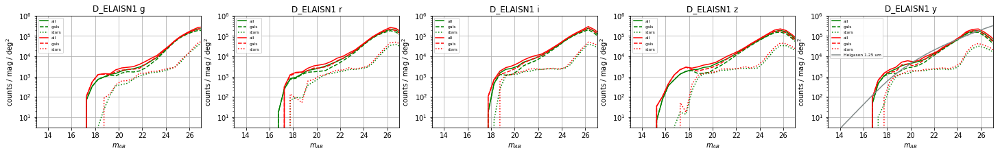

In [7]:
# mag func
df1 = df_clean[(df_clean['ra'] < 243) & (df_clean['ra'] > 242) \
               & (df_clean['dec'] < 54.8) & (df_clean['dec'] > 53.8)]
df2 = df_clean[(df_clean['ra'] < 243.8) & (df_clean['ra'] > 243.6) \
               & (df_clean['dec'] < 54.8) & (df_clean['dec'] > 53.8)]
area1 = 1 * 1 * np.cos(54*np.pi/180)
area2 = 0.2 * 1 * np.cos(54*np.pi/180)

binedges = np.arange(7,29,0.5)
bins = (binedges[:-1] + binedges[1:])/2

fig, ax = plt.subplots(1,5,figsize=(25,3))

for iband,band in enumerate(['g','r','i','z','y']):
    d = df1[band + 'mag_psf']
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g-',label='all')
    d = df1[band + 'mag_psf'][df1[band + 'cls']==1]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g--',label='gals')
    d = df1[band + 'mag_psf'][df1[band + 'cls']==0]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g:',label='stars')
    
    d = df2[band + 'mag_psf']
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r-',label='all')
    d = df2[band + 'mag_psf'][df2[band + 'cls']==1]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r--',label='gals')
    d = df2[band + 'mag_psf'][df2[band + 'cls']==0]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r:',label='stars')
    
    if band == 'y':
        helgdir = '/Users/ytcheng/ciber/doc/20170904_External/helgason/'
        helgdat = np.loadtxt(helgdir + 'Helgason125.txt', skiprows=1, delimiter=',')
        ax[iband].plot(helgdat[:,0],helgdat[:,1], '-', c = '#838B8B', label = 'Helgason 1.25 um')

    ax[iband].set_title(field + ' '+ band)
    ax[iband].set_xlim([13,27])
    ax[iband].set_ylim([3e0,1e6])
    ax[iband].set_yscale('log')
    ax[iband].set_xlabel('$m_{AB}$')
    ax[iband].set_ylabel('counts / mag / deg$^2$')
    ax[iband].legend(fontsize=6)
    ax[iband].grid()
fig.savefig(field + '_mfunc_clean', dpi = 256, bbox_inches='tight')

In [8]:
# post-processing

# drop rows with no mag in all bands
sp = np.all(np.isnan(df_clean[['gmag_psf','rmag_psf','imag_psf','zmag_psf','ymag_psf']]),axis=1)
df_clean = df_clean.iloc[~sp]

# set class to NaN if no mag in that band
for band in ['g','r','i','z','y']:
    sp = np.isnan(df_clean[band + 'mag_psf'])
    df_clean[band + 'cls'].iloc[np.where(sp)[0]] = np.nan
    
# get class
cls = np.nanmean(df_clean[['gcls','rcls','icls','zcls','ycls']], axis=1)
cls[cls < 0.5] = -1
cls[cls > 0.5] = 1
cls[cls == 0.5] = 2
df_clean['cls'] = cls

df_clean = get_corrected_mag(df_clean)

#
ra_cent = np.median(df_clean['ra'])
dec_cent = np.median(df_clean['dec'])
thx = (df_clean['ra']-ra_cent)*np.cos(df_clean['dec']*np.pi/180)
thy = df_clean['dec']-dec_cent
df_clean['thx'] = thx
df_clean['thy'] = thy

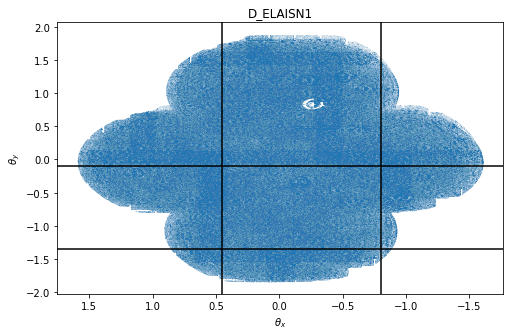

In [9]:
# choose regions for making maps
xmin = -0.8
xmax = 0.45
ymin = -1.35
ymax = -0.1

fig, ax = plt.subplots(1,1,figsize=(8,5))
ax.scatter(df_clean['thx'], df_clean['thy'], s=0.00005)
ax.set_xlabel(r'$\theta_x$')
ax.set_ylabel(r'$\theta_y$')
ax.set_title(field)
ax.invert_xaxis()
ax.axvline(xmin,c='k')
ax.axvline(xmax,c='k')
ax.axhline(ymin,c='k')
ax.axhline(ymax,c='k')
fig.savefig(field + '_fields', dpi = 256, bbox_inches='tight')

In [10]:
# 
x = (df_clean['thx'] - xmin)*3600/7
y = (df_clean['thy'] - ymin)*3600/7
df_clean['x'] = x
df_clean['y'] = y
npix_x = int(np.floor((xmax-xmin)*3600/7))
npix_y = int(np.floor((ymax-ymin)*3600/7))

In [11]:
df_save = df_clean[['ra','dec','x','y','I','H','cls','photz', 'photz_risk', 'specz', 'specz_err']]
df_save = df_save[(df_save['x']>0) & (df_save['x']<np.floor((xmax-xmin)*3600/7))\
                 &(df_save['y']>0) & (df_save['y']<np.floor((ymax-ymin)*3600/7))]

dirname='../../doc/20170617_Stacking/maps/catcoord/HSC/'
df_save.to_csv(dirname + field + '.csv', index=False, float_format='%.6f')

# D_DEEP2-3

In [15]:
field = 'D_DEEP2-3'
df = pd.read_csv(datadir + field + '_raw.csv')
df.rename(columns={"# ra": "ra"}, inplace = True)

In [16]:
# cleaning
df_clean = pd.DataFrame()
ra_lims = np.linspace(min(df['ra']),max(df['ra']),9)
dec_lims = np.linspace(min(df['dec']),max(df['dec']),9)
for ira,(ra1,ra2) in enumerate(zip(ra_lims[:-1],ra_lims[1:])):
    for idec,(dec1,dec2) in enumerate(zip(dec_lims[:-1],dec_lims[1:])):
        print("cleaning region (%d,%d)"%(ira,idec))
        dfs = df[(df['ra']>=ra1) & (df['ra']<ra2) & (df['dec']>=dec1) & (df['dec']<dec2)]
        dfs = clean_hsc(dfs)
        df_clean = df_clean.append(dfs)

cleaning region (0,0)
cleaning df (5075 -> 3517), time = 0.01 min
cleaning region (0,1)
cleaning df (108224 -> 72356), time = 1.11 min
cleaning region (0,2)
cleaning df (137654 -> 89009), time = 1.86 min
cleaning region (0,3)
cleaning df (100530 -> 65564), time = 0.91 min
cleaning region (0,4)
cleaning df (9523 -> 7478), time = 0.02 min
cleaning region (0,5)
cleaning df (0 -> 0), time = 0.00 min
cleaning region (0,6)
cleaning df (0 -> 0), time = 0.00 min
cleaning region (0,7)
cleaning df (0 -> 0), time = 0.00 min
cleaning region (1,0)
cleaning df (113305 -> 64116), time = 1.50 min
cleaning region (1,1)
cleaning df (126764 -> 104789), time = 2.19 min
cleaning region (1,2)
cleaning df (145134 -> 121970), time = 2.79 min
cleaning region (1,3)
cleaning df (127656 -> 105717), time = 2.45 min
cleaning region (1,4)
cleaning df (102759 -> 72502), time = 1.12 min
cleaning region (1,5)
cleaning df (42585 -> 36980), time = 0.26 min
cleaning region (1,6)
cleaning df (22651 -> 19344), time = 0.10 m

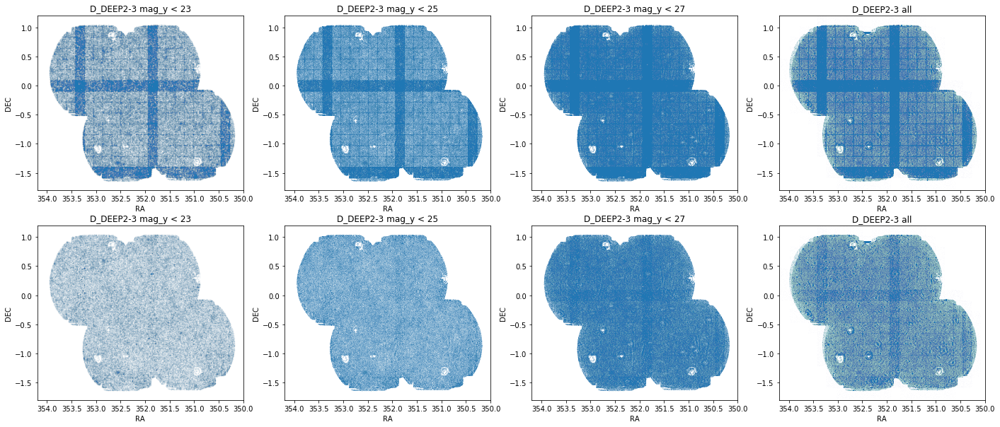

In [17]:
# plot cleaning map
fig, ax = plt.subplots(2,4,figsize=(24,10))

ax[0][0].scatter(df['ra'][df['ymag_psf']<23], df['dec'][df['ymag_psf']<23], s=0.0002)
ax[0][0].set_xlabel('RA')
ax[0][0].set_ylabel('DEC')
ax[0][0].set_title(field + ' mag_y < 23')
ax[0][0].set_xlim([350,354.2])
ax[0][0].set_ylim([-1.8,1.2])
ax[0][0].invert_xaxis()

ax[0][1].scatter(df['ra'][df['ymag_psf']<25], df['dec'][df['ymag_psf']<25], s=0.0001)
ax[0][1].set_xlabel('RA')
ax[0][1].set_ylabel('DEC')
ax[0][1].set_title(field + ' mag_y < 25')
ax[0][1].set_xlim([350,354.2])
ax[0][1].set_ylim([-1.8,1.2])
ax[0][1].invert_xaxis()

ax[0][2].scatter(df['ra'][df['ymag_psf']<27], df['dec'][df['ymag_psf']<27], s=0.00005)
ax[0][2].set_xlabel('RA')
ax[0][2].set_ylabel('DEC')
ax[0][2].set_title(field + ' mag_y < 27')
ax[0][2].set_xlim([350,354.2])
ax[0][2].set_ylim([-1.8,1.2])
ax[0][2].invert_xaxis()

ax[0][3].scatter(df['ra'], df['dec'], s=0.00001)
ax[0][3].set_xlabel('RA')
ax[0][3].set_ylabel('DEC')
ax[0][3].set_title(field + ' all')
ax[0][3].set_xlim([350,354.2])
ax[0][3].set_ylim([-1.8,1.2])
ax[0][3].invert_xaxis()

ax[1][0].scatter(df_clean['ra'][df_clean['ymag_psf']<23], df_clean['dec'][df_clean['ymag_psf']<23], s=0.0002)
ax[1][0].set_xlabel('RA')
ax[1][0].set_ylabel('DEC')
ax[1][0].set_title(field + ' mag_y < 23')
ax[1][0].set_xlim([350,354.2])
ax[1][0].set_ylim([-1.8,1.2])
ax[1][0].invert_xaxis()

ax[1][1].scatter(df_clean['ra'][df_clean['ymag_psf']<25], df_clean['dec'][df_clean['ymag_psf']<25], s=0.0001)
ax[1][1].set_xlabel('RA')
ax[1][1].set_ylabel('DEC')
ax[1][1].set_title(field + ' mag_y < 25')
ax[1][1].set_xlim([350,354.2])
ax[1][1].set_ylim([-1.8,1.2])
ax[1][1].invert_xaxis()

ax[1][2].scatter(df_clean['ra'][df_clean['ymag_psf']<27], df_clean['dec'][df_clean['ymag_psf']<27], s=0.00005)
ax[1][2].set_xlabel('RA')
ax[1][2].set_ylabel('DEC')
ax[1][2].set_title(field + ' mag_y < 27')
ax[1][2].set_xlim([350,354.2])
ax[1][2].set_ylim([-1.8,1.2])
ax[1][2].invert_xaxis()

ax[1][3].scatter(df_clean['ra'], df_clean['dec'], s=0.00001)
ax[1][3].set_xlabel('RA')
ax[1][3].set_ylabel('DEC')
ax[1][3].set_title(field + ' all')
ax[1][3].set_xlim([350,354.2])
ax[1][3].set_ylim([-1.8,1.2])
ax[1][3].invert_xaxis()
fig.savefig(field + '_map_clean', dpi = 256, bbox_inches='tight')

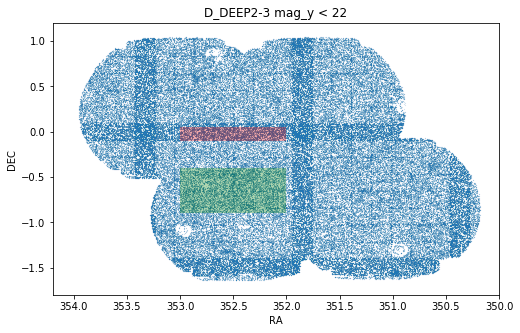

In [18]:
# choose regions for plotting mag func
fig, ax = plt.subplots(1,1,figsize=(8,5))
ax.scatter(df['ra'][df['ymag_psf']<22], df['dec'][df['ymag_psf']<22], s=0.005)
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.set_title(field + ' mag_y < 22')
ax.set_xlim([350,354.2])
ax.set_ylim([-1.8,1.2])
ax.broken_barh([(352,1)],(-0.9,0.5), facecolors='green', alpha=0.3)
ax.broken_barh([(352,1)],(-0.1,0.15), facecolors='red', alpha=0.3)
ax.invert_xaxis()

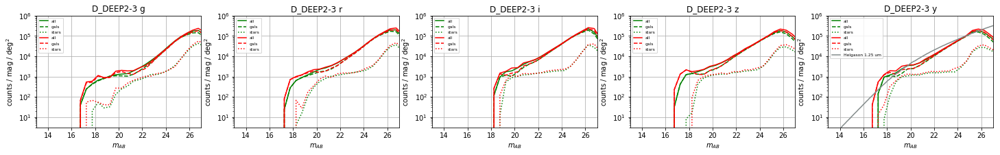

In [19]:
# mag func
df1 = df_clean[(df_clean['ra'] < 353) & (df_clean['ra'] > 352) \
               & (df_clean['dec'] < -0.4) & (df_clean['dec'] > -0.9)]
df2 = df_clean[(df_clean['ra'] < 353) & (df_clean['ra'] > 352) \
               & (df_clean['dec'] < 0.05) & (df_clean['dec'] > -0.1)]
area1 = 1 * 0.5
area2 = 1 * 0.15

binedges = np.arange(7,29,0.5)
bins = (binedges[:-1] + binedges[1:])/2

fig, ax = plt.subplots(1,5,figsize=(25,3))

for iband,band in enumerate(['g','r','i','z','y']):
    d = df1[band + 'mag_psf']
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g-',label='all')
    d = df1[band + 'mag_psf'][df1[band + 'cls']==1]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g--',label='gals')
    d = df1[band + 'mag_psf'][df1[band + 'cls']==0]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g:',label='stars')
    
    d = df2[band + 'mag_psf']
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r-',label='all')
    d = df2[band + 'mag_psf'][df2[band + 'cls']==1]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r--',label='gals')
    d = df2[band + 'mag_psf'][df2[band + 'cls']==0]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r:',label='stars')
    
    if band == 'y':
        helgdir = '/Users/ytcheng/ciber/doc/20170904_External/helgason/'
        helgdat = np.loadtxt(helgdir + 'Helgason125.txt', skiprows=1, delimiter=',')
        ax[iband].plot(helgdat[:,0],helgdat[:,1], '-', c = '#838B8B', label = 'Helgason 1.25 um')

    ax[iband].set_title(field + ' '+ band)
    ax[iband].set_xlim([13,27])
    ax[iband].set_ylim([3e0,1e6])
    ax[iband].set_yscale('log')
    ax[iband].set_xlabel('$m_{AB}$')
    ax[iband].set_ylabel('counts / mag / deg$^2$')
    ax[iband].legend(fontsize=6)
    ax[iband].grid()
fig.savefig(field + '_mfunc_clean', dpi = 256, bbox_inches='tight')

In [20]:
# post-processing

# drop rows with no mag in all bands
sp = np.all(np.isnan(df_clean[['gmag_psf','rmag_psf','imag_psf','zmag_psf','ymag_psf']]),axis=1)
df_clean = df_clean.iloc[~sp]

# set class to NaN if no mag in that band
for band in ['g','r','i','z','y']:
    sp = np.isnan(df_clean[band + 'mag_psf'])
    df_clean[band + 'cls'].iloc[np.where(sp)[0]] = np.nan
    
# get class
cls = np.nanmean(df_clean[['gcls','rcls','icls','zcls','ycls']], axis=1)
cls[cls < 0.5] = -1
cls[cls > 0.5] = 1
cls[cls == 0.5] = 2
df_clean['cls'] = cls

df_clean = get_corrected_mag(df_clean)

#
ra_cent = np.median(df_clean['ra'])
dec_cent = np.median(df_clean['dec'])
thx = (df_clean['ra']-ra_cent)*np.cos(df_clean['dec']*np.pi/180)
thy = df_clean['dec']-dec_cent
df_clean['thx'] = thx
df_clean['thy'] = thy

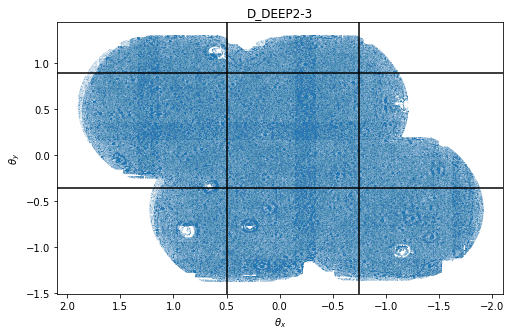

In [21]:
# choose regions for making maps
xmin = -0.75
xmax = 0.5
ymin = -0.35
ymax = 0.9

fig, ax = plt.subplots(1,1,figsize=(8,5))
ax.scatter(df_clean['thx'], df_clean['thy'], s=0.00005)
ax.set_xlabel(r'$\theta_x$')
ax.set_ylabel(r'$\theta_y$')
ax.set_title(field)
ax.invert_xaxis()
ax.axvline(xmin,c='k')
ax.axvline(xmax,c='k')
ax.axhline(ymin,c='k')
ax.axhline(ymax,c='k')
fig.savefig(field + '_fields', dpi = 256, bbox_inches='tight')

In [22]:
# 
x = (df_clean['thx'] - xmin)*3600/7
y = (df_clean['thy'] - ymin)*3600/7
df_clean['x'] = x
df_clean['y'] = y
npix_x = int(np.floor((xmax-xmin)*3600/7))
npix_y = int(np.floor((ymax-ymin)*3600/7))

In [23]:
df_save = df_clean[['ra','dec','x','y','I','H','cls','photz', 'photz_risk', 'specz', 'specz_err']]
df_save = df_save[(df_save['x']>0) & (df_save['x']<np.floor((xmax-xmin)*3600/7))\
                 &(df_save['y']>0) & (df_save['y']<np.floor((ymax-ymin)*3600/7))]

dirname='../../doc/20170617_Stacking/maps/catcoord/HSC/'
df_save.to_csv(dirname + field + '.csv', index=False, float_format='%.6f')

# UD_COSMOS

In [24]:
field = 'UD_COSMOS'
df = pd.read_csv(datadir + field + '_raw.csv')
df.rename(columns={"# ra": "ra"}, inplace = True)

In [25]:
# cleaning
df_clean = pd.DataFrame()
ra_lims = np.linspace(min(df['ra']),max(df['ra']),9)
dec_lims = np.linspace(min(df['dec']),max(df['dec']),9)
for ira,(ra1,ra2) in enumerate(zip(ra_lims[:-1],ra_lims[1:])):
    for idec,(dec1,dec2) in enumerate(zip(dec_lims[:-1],dec_lims[1:])):
        print("cleaning region (%d,%d)"%(ira,idec))
        dfs = df[(df['ra']>=ra1) & (df['ra']<ra2) & (df['dec']>=dec1) & (df['dec']<dec2)]
        dfs = clean_hsc(dfs)
        df_clean = df_clean.append(dfs)

cleaning region (0,0)
cleaning df (0 -> 0), time = 0.00 min
cleaning region (0,1)
cleaning df (224 -> 209), time = 0.00 min
cleaning region (0,2)
cleaning df (9988 -> 8928), time = 0.03 min
cleaning region (0,3)
cleaning df (21833 -> 18091), time = 0.08 min
cleaning region (0,4)
cleaning df (21028 -> 17817), time = 0.08 min
cleaning region (0,5)
cleaning df (8067 -> 6686), time = 0.02 min
cleaning region (0,6)
cleaning df (93 -> 91), time = 0.00 min
cleaning region (0,7)
cleaning df (0 -> 0), time = 0.00 min
cleaning region (1,0)
cleaning df (251 -> 244), time = 0.00 min
cleaning region (1,1)
cleaning df (29006 -> 20167), time = 0.11 min
cleaning region (1,2)
cleaning df (68090 -> 39846), time = 0.31 min
cleaning region (1,3)
cleaning df (95435 -> 55618), time = 0.57 min
cleaning region (1,4)
cleaning df (89725 -> 51741), time = 0.60 min
cleaning region (1,5)
cleaning df (87427 -> 49712), time = 0.51 min
cleaning region (1,6)
cleaning df (55833 -> 29412), time = 0.25 min
cleaning regio

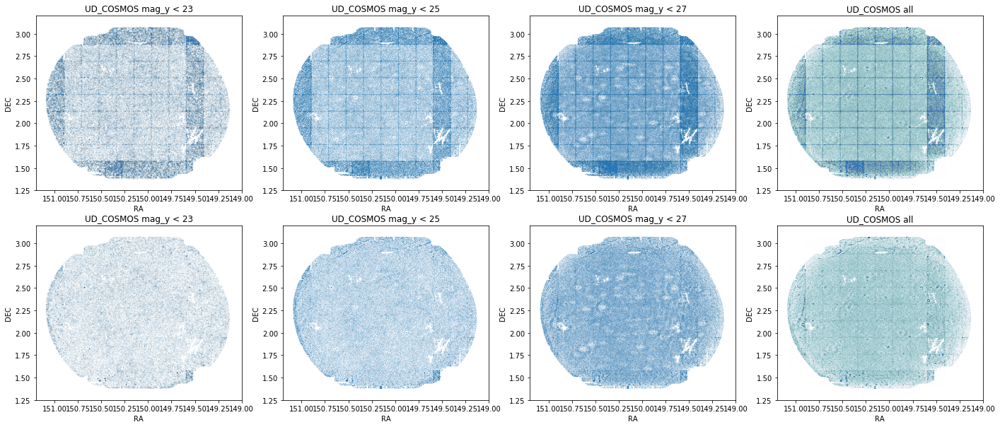

In [26]:
# plot cleaning map
fig, ax = plt.subplots(2,4,figsize=(24,10))

ax[0][0].scatter(df['ra'][df['ymag_psf']<23], df['dec'][df['ymag_psf']<23], s=0.0002)
ax[0][0].set_xlabel('RA')
ax[0][0].set_ylabel('DEC')
ax[0][0].set_title(field + ' mag_y < 23')
ax[0][0].set_xlim([149,151.2])
ax[0][0].set_ylim([1.25,3.2])
ax[0][0].invert_xaxis()

ax[0][1].scatter(df['ra'][df['ymag_psf']<25], df['dec'][df['ymag_psf']<25], s=0.0001)
ax[0][1].set_xlabel('RA')
ax[0][1].set_ylabel('DEC')
ax[0][1].set_title(field + ' mag_y < 25')
ax[0][1].set_xlim([149,151.2])
ax[0][1].set_ylim([1.25,3.2])
ax[0][1].invert_xaxis()

ax[0][2].scatter(df['ra'][df['ymag_psf']<27], df['dec'][df['ymag_psf']<27], s=0.00005)
ax[0][2].set_xlabel('RA')
ax[0][2].set_ylabel('DEC')
ax[0][2].set_title(field + ' mag_y < 27')
ax[0][2].set_xlim([149,151.2])
ax[0][2].set_ylim([1.25,3.2])
ax[0][2].invert_xaxis()

ax[0][3].scatter(df['ra'], df['dec'], s=0.00001)
ax[0][3].set_xlabel('RA')
ax[0][3].set_ylabel('DEC')
ax[0][3].set_title(field + ' all')
ax[0][3].set_xlim([149,151.2])
ax[0][3].set_ylim([1.25,3.2])
ax[0][3].invert_xaxis()

ax[1][0].scatter(df_clean['ra'][df_clean['ymag_psf']<23], df_clean['dec'][df_clean['ymag_psf']<23], s=0.0002)
ax[1][0].set_xlabel('RA')
ax[1][0].set_ylabel('DEC')
ax[1][0].set_title(field + ' mag_y < 23')
ax[1][0].set_xlim([149,151.2])
ax[1][0].set_ylim([1.25,3.2])
ax[1][0].invert_xaxis()

ax[1][1].scatter(df_clean['ra'][df_clean['ymag_psf']<25], df_clean['dec'][df_clean['ymag_psf']<25], s=0.0001)
ax[1][1].set_xlabel('RA')
ax[1][1].set_ylabel('DEC')
ax[1][1].set_title(field + ' mag_y < 25')
ax[1][1].set_xlim([149,151.2])
ax[1][1].set_ylim([1.25,3.2])
ax[1][1].invert_xaxis()

ax[1][2].scatter(df_clean['ra'][df_clean['ymag_psf']<27], df_clean['dec'][df_clean['ymag_psf']<27], s=0.00005)
ax[1][2].set_xlabel('RA')
ax[1][2].set_ylabel('DEC')
ax[1][2].set_title(field + ' mag_y < 27')
ax[1][2].set_xlim([149,151.2])
ax[1][2].set_ylim([1.25,3.2])
ax[1][2].invert_xaxis()

ax[1][3].scatter(df_clean['ra'], df_clean['dec'], s=0.00001)
ax[1][3].set_xlabel('RA')
ax[1][3].set_ylabel('DEC')
ax[1][3].set_title(field + ' all')
ax[1][3].set_xlim([149,151.2])
ax[1][3].set_ylim([1.25,3.2])
ax[1][3].invert_xaxis()
fig.savefig(field + '_map_clean', dpi = 256, bbox_inches='tight')

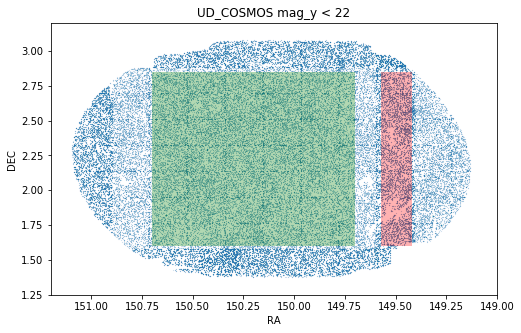

In [27]:
# choose regions for plotting mag func
fig, ax = plt.subplots(1,1,figsize=(8,5))
ax.scatter(df['ra'][df['ymag_psf']<22], df['dec'][df['ymag_psf']<22], s=0.005)
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.set_title(field + ' mag_y < 22')
ax.set_xlim([149,151.2])
ax.set_ylim([1.25,3.2])
ax.broken_barh([(149.7,1)],(1.6,1.25), facecolors='green', alpha=0.3)
ax.broken_barh([(149.42,0.15)],(1.6,1.25), facecolors='red', alpha=0.3)
ax.invert_xaxis()

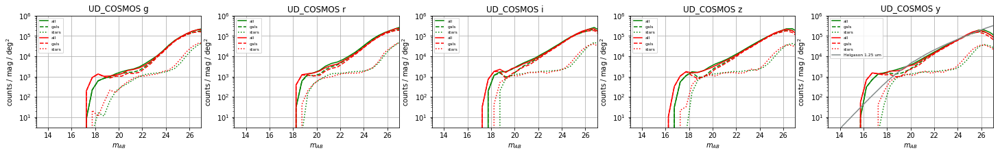

In [28]:
# mag func
df1 = df_clean[(df_clean['ra'] < 150.7) & (df_clean['ra'] > 149.7) \
               & (df_clean['dec'] < 2.85) & (df_clean['dec'] > 1.6)]
df2 = df_clean[(df_clean['ra'] < 149.57) & (df_clean['ra'] > 149.42) \
               & (df_clean['dec'] < 2.85) & (df_clean['dec'] > 1.6)]
area1 = 1 * 1.25
area2 = 0.15 * 1.25

binedges = np.arange(7,29,0.5)
bins = (binedges[:-1] + binedges[1:])/2

fig, ax = plt.subplots(1,5,figsize=(25,3))

for iband,band in enumerate(['g','r','i','z','y']):
    d = df1[band + 'mag_psf']
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g-',label='all')
    d = df1[band + 'mag_psf'][df1[band + 'cls']==1]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g--',label='gals')
    d = df1[band + 'mag_psf'][df1[band + 'cls']==0]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g:',label='stars')
    
    d = df2[band + 'mag_psf']
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r-',label='all')
    d = df2[band + 'mag_psf'][df2[band + 'cls']==1]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r--',label='gals')
    d = df2[band + 'mag_psf'][df2[band + 'cls']==0]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r:',label='stars')
    
    if band == 'y':
        helgdir = '/Users/ytcheng/ciber/doc/20170904_External/helgason/'
        helgdat = np.loadtxt(helgdir + 'Helgason125.txt', skiprows=1, delimiter=',')
        ax[iband].plot(helgdat[:,0],helgdat[:,1], '-', c = '#838B8B', label = 'Helgason 1.25 um')

    ax[iband].set_title(field + ' '+ band)
    ax[iband].set_xlim([13,27])
    ax[iband].set_ylim([3e0,1e6])
    ax[iband].set_yscale('log')
    ax[iband].set_xlabel('$m_{AB}$')
    ax[iband].set_ylabel('counts / mag / deg$^2$')
    ax[iband].legend(fontsize=6)
    ax[iband].grid()
fig.savefig(field + '_mfunc_clean', dpi = 256, bbox_inches='tight')

In [29]:
# post-processing

# drop rows with no mag in all bands
sp = np.all(np.isnan(df_clean[['gmag_psf','rmag_psf','imag_psf','zmag_psf','ymag_psf']]),axis=1)
df_clean = df_clean.iloc[~sp]

# set class to NaN if no mag in that band
for band in ['g','r','i','z','y']:
    sp = np.isnan(df_clean[band + 'mag_psf'])
    df_clean[band + 'cls'].iloc[np.where(sp)[0]] = np.nan
    
# get class
cls = np.nanmean(df_clean[['gcls','rcls','icls','zcls','ycls']], axis=1)
cls[cls < 0.5] = -1
cls[cls > 0.5] = 1
cls[cls == 0.5] = 2
df_clean['cls'] = cls

df_clean = get_corrected_mag(df_clean)

#
ra_cent = np.median(df_clean['ra'])
dec_cent = np.median(df_clean['dec'])
thx = (df_clean['ra']-ra_cent)*np.cos(df_clean['dec']*np.pi/180)
thy = df_clean['dec']-dec_cent
df_clean['thx'] = thx
df_clean['thy'] = thy

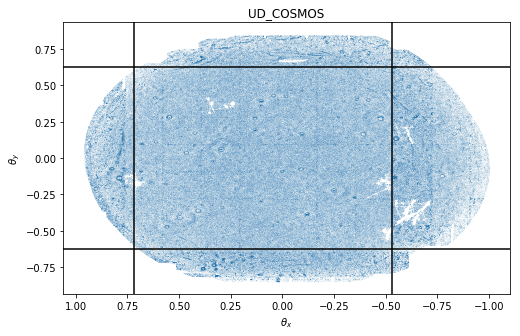

In [30]:
# choose regions for making maps
xmin = -0.53
xmax = 0.72
ymin = -0.625
ymax = 0.625

fig, ax = plt.subplots(1,1,figsize=(8,5))
ax.scatter(df_clean['thx'], df_clean['thy'], s=0.00005)
ax.set_xlabel(r'$\theta_x$')
ax.set_ylabel(r'$\theta_y$')
ax.set_title(field)
ax.invert_xaxis()
ax.axvline(xmin,c='k')
ax.axvline(xmax,c='k')
ax.axhline(ymin,c='k')
ax.axhline(ymax,c='k')
fig.savefig(field + '_fields', dpi = 256, bbox_inches='tight')

In [31]:
# 
x = (df_clean['thx'] - xmin)*3600/7
y = (df_clean['thy'] - ymin)*3600/7
df_clean['x'] = x
df_clean['y'] = y
npix_x = int(np.floor((xmax-xmin)*3600/7))
npix_y = int(np.floor((ymax-ymin)*3600/7))

In [32]:
df_save = df_clean[['ra','dec','x','y','I','H','cls','photz', 'photz_risk', 'specz', 'specz_err']]
df_save = df_save[(df_save['x']>0) & (df_save['x']<np.floor((xmax-xmin)*3600/7))\
                 &(df_save['y']>0) & (df_save['y']<np.floor((ymax-ymin)*3600/7))]

dirname='../../doc/20170617_Stacking/maps/catcoord/HSC/'
df_save.to_csv(dirname + field + '.csv', index=False, float_format='%.6f')

# XMM

In [33]:
field = 'XMM'
df = pd.read_csv(datadir + field + '_raw.csv')
df.rename(columns={"# ra": "ra"}, inplace = True)

In [34]:
# cleaning
df_clean = pd.DataFrame()
ra_lims = np.linspace(min(df['ra']),max(df['ra']),9)
dec_lims = np.linspace(min(df['dec']),max(df['dec']),9)
for ira,(ra1,ra2) in enumerate(zip(ra_lims[:-1],ra_lims[1:])):
    for idec,(dec1,dec2) in enumerate(zip(dec_lims[:-1],dec_lims[1:])):
        print("cleaning region (%d,%d)"%(ira,idec))
        dfs = df[(df['ra']>=ra1) & (df['ra']<ra2) & (df['dec']>=dec1) & (df['dec']<dec2)]
        dfs = clean_hsc(dfs)
        df_clean = df_clean.append(dfs)

cleaning region (0,0)
cleaning df (220134 -> 120120), time = 2.94 min
cleaning region (0,1)
cleaning df (180344 -> 114282), time = 3.63 min
cleaning region (0,2)
cleaning df (170197 -> 116159), time = 2.67 min
cleaning region (0,3)
cleaning df (162111 -> 111540), time = 2.30 min
cleaning region (0,4)
cleaning df (177648 -> 114975), time = 3.41 min
cleaning region (0,5)
cleaning df (247806 -> 127835), time = 3.18 min
cleaning region (0,6)
cleaning df (172691 -> 121357), time = 4.77 min
cleaning region (0,7)
cleaning df (183913 -> 129104), time = 5.29 min
cleaning region (1,0)
cleaning df (174510 -> 110645), time = 3.11 min
cleaning region (1,1)
cleaning df (135570 -> 102932), time = 1.97 min
cleaning region (1,2)
cleaning df (125986 -> 103396), time = 2.64 min
cleaning region (1,3)
cleaning df (130248 -> 106331), time = 3.14 min
cleaning region (1,4)
cleaning df (148938 -> 112745), time = 2.49 min
cleaning region (1,5)
cleaning df (210695 -> 130238), time = 3.64 min
cleaning region (1,6

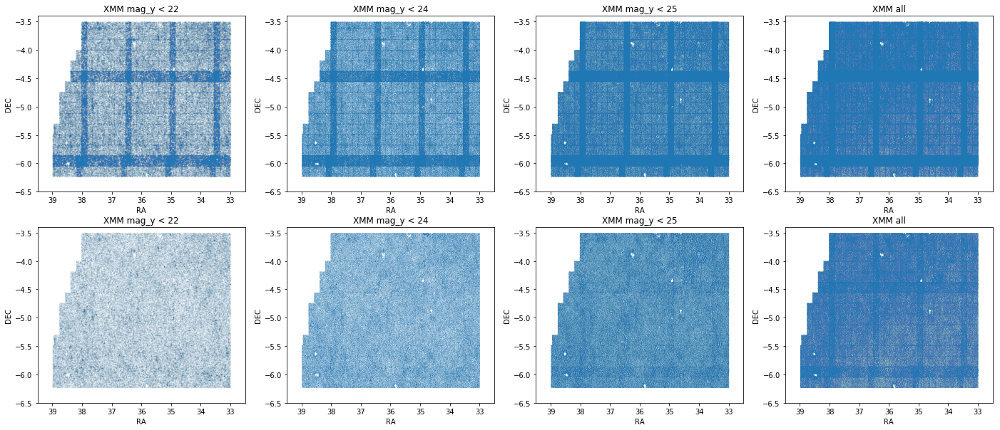

In [35]:
# plot cleaning map
fig, ax = plt.subplots(2,4,figsize=(24,10))

ax[0][0].scatter(df['ra'][df['ymag_psf']<22], df['dec'][df['ymag_psf']<22], s=0.0002)
ax[0][0].set_xlabel('RA')
ax[0][0].set_ylabel('DEC')
ax[0][0].set_title(field + ' mag_y < 22')
ax[0][0].set_xlim([32.5,39.5])
ax[0][0].set_ylim([-6.5,-3.4])
ax[0][0].invert_xaxis()

ax[0][1].scatter(df['ra'][df['ymag_psf']<24], df['dec'][df['ymag_psf']<24], s=0.0001)
ax[0][1].set_xlabel('RA')
ax[0][1].set_ylabel('DEC')
ax[0][1].set_title(field + ' mag_y < 24')
ax[0][1].set_xlim([32.5,39.5])
ax[0][1].set_ylim([-6.5,-3.4])
ax[0][1].invert_xaxis()

ax[0][2].scatter(df['ra'][df['ymag_psf']<25], df['dec'][df['ymag_psf']<25], s=0.00005)
ax[0][2].set_xlabel('RA')
ax[0][2].set_ylabel('DEC')
ax[0][2].set_title(field + ' mag_y < 25')
ax[0][2].set_xlim([32.5,39.5])
ax[0][2].set_ylim([-6.5,-3.4])
ax[0][2].invert_xaxis()

ax[0][3].scatter(df['ra'], df['dec'], s=0.00001)
ax[0][3].set_xlabel('RA')
ax[0][3].set_ylabel('DEC')
ax[0][3].set_title(field + ' all')
ax[0][3].set_xlim([32.5,39.5])
ax[0][3].set_ylim([-6.5,-3.4])
ax[0][3].invert_xaxis()

ax[1][0].scatter(df_clean['ra'][df_clean['ymag_psf']<22], df_clean['dec'][df_clean['ymag_psf']<22], s=0.0002)
ax[1][0].set_xlabel('RA')
ax[1][0].set_ylabel('DEC')
ax[1][0].set_title(field + ' mag_y < 22')
ax[1][0].set_xlim([32.5,39.5])
ax[1][0].set_ylim([-6.5,-3.4])
ax[1][0].invert_xaxis()

ax[1][1].scatter(df_clean['ra'][df_clean['ymag_psf']<24], df_clean['dec'][df_clean['ymag_psf']<24], s=0.0001)
ax[1][1].set_xlabel('RA')
ax[1][1].set_ylabel('DEC')
ax[1][1].set_title(field + ' mag_y < 24')
ax[1][1].set_xlim([32.5,39.5])
ax[1][1].set_ylim([-6.5,-3.4])
ax[1][1].invert_xaxis()

ax[1][2].scatter(df_clean['ra'][df_clean['ymag_psf']<25], df_clean['dec'][df_clean['ymag_psf']<25], s=0.00005)
ax[1][2].set_xlabel('RA')
ax[1][2].set_ylabel('DEC')
ax[1][2].set_title(field + ' mag_y < 25')
ax[1][2].set_xlim([32.5,39.5])
ax[1][2].set_ylim([-6.5,-3.4])
ax[1][2].invert_xaxis()

ax[1][3].scatter(df_clean['ra'], df_clean['dec'], s=0.00001)
ax[1][3].set_xlabel('RA')
ax[1][3].set_ylabel('DEC')
ax[1][3].set_title(field + ' all')
ax[1][3].set_xlim([32.5,39.5])
ax[1][3].set_ylim([-6.5,-3.4])
ax[1][3].invert_xaxis()
fig.savefig(field + '_map_clean', dpi = 256, bbox_inches='tight')

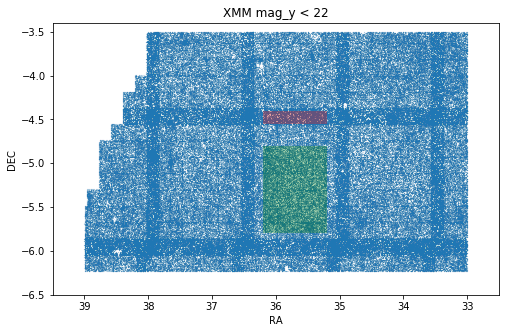

In [36]:
# choose regions for plotting mag func
fig, ax = plt.subplots(1,1,figsize=(8,5))
ax.scatter(df['ra'][df['ymag_psf']<22], df['dec'][df['ymag_psf']<22], s=0.005)
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.set_title(field + ' mag_y < 22')
ax.set_xlim([32.5,39.5])
ax.set_ylim([-6.5,-3.4])
ax.broken_barh([(35.2,1)],(-5.8,1), facecolors='green', alpha=0.3)
ax.broken_barh([(35.2,1)],(-4.55,0.15), facecolors='red', alpha=0.3)
ax.invert_xaxis()

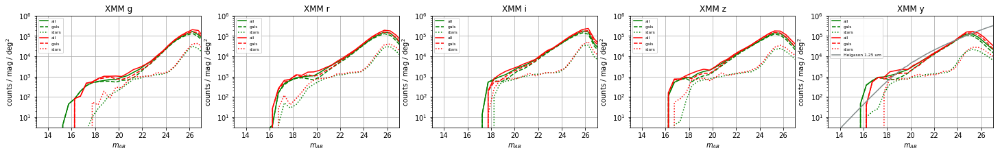

In [37]:
#

df1 = df_clean[(df_clean['ra'] < 36.2) & (df_clean['ra'] > 35.2) \
               & (df_clean['dec'] < -4.8) & (df_clean['dec'] > -5.8)]
df2 = df_clean[(df_clean['ra'] < 36.2) & (df_clean['ra'] > 35.2) \
               & (df_clean['dec'] < -4.4) & (df_clean['dec'] > -4.55)]
area1 = 1 * 1
area2 = 1 * 0.15

binedges = np.arange(7,29,0.5)
bins = (binedges[:-1] + binedges[1:])/2

fig, ax = plt.subplots(1,5,figsize=(25,3))

for iband,band in enumerate(['g','r','i','z','y']):
    d = df1[band + 'mag_psf']
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g-',label='all')
    d = df1[band + 'mag_psf'][df1[band + 'cls']==1]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g--',label='gals')
    d = df1[band + 'mag_psf'][df1[band + 'cls']==0]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g:',label='stars')
    
    d = df2[band + 'mag_psf']
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r-',label='all')
    d = df2[band + 'mag_psf'][df2[band + 'cls']==1]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r--',label='gals')
    d = df2[band + 'mag_psf'][df2[band + 'cls']==0]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r:',label='stars')
    
    if band == 'y':
        helgdir = '/Users/ytcheng/ciber/doc/20170904_External/helgason/'
        helgdat = np.loadtxt(helgdir + 'Helgason125.txt', skiprows=1, delimiter=',')
        ax[iband].plot(helgdat[:,0],helgdat[:,1], '-', c = '#838B8B', label = 'Helgason 1.25 um')

    ax[iband].set_title(field + ' '+ band)
    ax[iband].set_xlim([13,27])
    ax[iband].set_ylim([3e0,1e6])
    ax[iband].set_yscale('log')
    ax[iband].set_xlabel('$m_{AB}$')
    ax[iband].set_ylabel('counts / mag / deg$^2$')
    ax[iband].legend(fontsize=6)
    ax[iband].grid()
fig.savefig(field + '_mfunc_clean', dpi = 256, bbox_inches='tight')

In [38]:
# post-processing

# drop rows with no mag in all bands
sp = np.all(np.isnan(df_clean[['gmag_psf','rmag_psf','imag_psf','zmag_psf','ymag_psf']]),axis=1)
df_clean = df_clean.iloc[~sp]

# set class to NaN if no mag in that band
for band in ['g','r','i','z','y']:
    sp = np.isnan(df_clean[band + 'mag_psf'])
    df_clean[band + 'cls'].iloc[np.where(sp)[0]] = np.nan
    
# get class
cls = np.nanmean(df_clean[['gcls','rcls','icls','zcls','ycls']], axis=1)
cls[cls < 0.5] = -1
cls[cls > 0.5] = 1
cls[cls == 0.5] = 2
df_clean['cls'] = cls

df_clean = get_corrected_mag(df_clean)

#
ra_cent = np.median(df_clean['ra'])
dec_cent = np.median(df_clean['dec'])
thx = (df_clean['ra']-ra_cent)*np.cos(df_clean['dec']*np.pi/180)
thy = df_clean['dec']-dec_cent
df_clean['thx'] = thx
df_clean['thy'] = thy

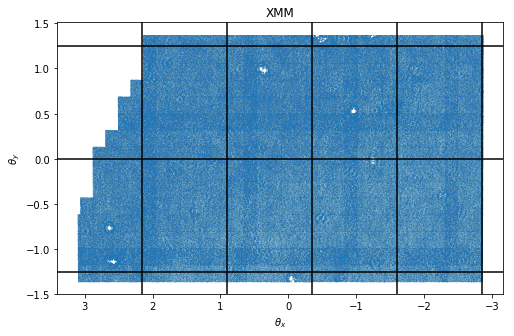

In [39]:
# choose regions for making maps
xmin_all = -2.85
xmax_all = 2.15
xmin_arr = np.linspace(xmin_all,xmax_all,5)[:-1]
xmax_arr = np.linspace(xmin_all,xmax_all,5)[1:]
ymin_all = -1.25
ymax_all = 1.25
ymin_arr = np.linspace(ymin_all,ymax_all,3)[:-1]
ymax_arr = np.linspace(ymin_all,ymax_all,3)[1:]

fig, ax = plt.subplots(1,1,figsize=(8,5))
ax.scatter(df_clean['thx'], df_clean['thy'], s=0.00005)
ax.set_xlabel(r'$\theta_x$')
ax.set_ylabel(r'$\theta_y$')
ax.set_title(field)
ax.invert_xaxis()
for x in np.linspace(xmin_all,xmax_all,5):
    ax.axvline(x,c='k')
for y in np.linspace(ymin_all,ymax_all,3):
    ax.axhline(y,c='k')   
fig.savefig(field + '_fields', dpi = 256, bbox_inches='tight')

In [40]:
# 
dirname='../../doc/20170617_Stacking/maps/catcoord/HSC/'
for ix,(xmin,xmax) in enumerate(zip(xmin_arr,xmax_arr)):
    for iy,(ymin,ymax) in enumerate(zip(ymin_arr,ymax_arr)):
        x = (df_clean['thx'] - xmin)*3600/7
        y = (df_clean['thy'] - ymin)*3600/7
        df_clean['x'] = x
        df_clean['y'] = y
        npix_x = int(np.floor((xmax-xmin)*3600/7))
        npix_y = int(np.floor((ymax-ymin)*3600/7))
        df_save = df_clean[['ra','dec','x','y','I','H','cls','photz', 'photz_risk', 'specz', 'specz_err']]
        df_save = df_save[(df_save['x']>0) & (df_save['x']<np.floor((xmax-xmin)*3600/7))\
                 &(df_save['y']>0) & (df_save['y']<np.floor((ymax-ymin)*3600/7))]
        df_save.to_csv(dirname + field + '_%d%d.csv'%(ix,iy), index=False, float_format='%.6f')

# GAMA09H

In [3]:
field = 'GAMA09H'
df = pd.read_csv(datadir + field + '_raw.csv')
df.rename(columns={"# ra": "ra"}, inplace = True)

In [4]:
# cleaning
df_clean = pd.DataFrame()
ra_lims = np.linspace(min(df['ra']),max(df['ra']),9)
dec_lims = np.linspace(min(df['dec']),max(df['dec']),9)
for ira,(ra1,ra2) in enumerate(zip(ra_lims[:-1],ra_lims[1:])):
    for idec,(dec1,dec2) in enumerate(zip(dec_lims[:-1],dec_lims[1:])):
        print("cleaning region (%d,%d)"%(ira,idec))
        dfs = df[(df['ra']>=ra1) & (df['ra']<ra2) & (df['dec']>=dec1) & (df['dec']<dec2)]
        dfs = clean_hsc(dfs)
        df_clean = df_clean.append(dfs)

cleaning region (0,0)
cleaning df (219456 -> 132963), time = 4.24 min
cleaning region (0,1)
cleaning df (197296 -> 144174), time = 3.78 min
cleaning region (0,2)
cleaning df (171885 -> 140806), time = 2.97 min
cleaning region (0,3)
cleaning df (162334 -> 134558), time = 3.55 min
cleaning region (0,4)
cleaning df (154833 -> 127207), time = 2.96 min
cleaning region (0,5)
cleaning df (219253 -> 134103), time = 3.26 min
cleaning region (0,6)
cleaning df (138091 -> 114825), time = 2.24 min
cleaning region (0,7)
cleaning df (110366 -> 93754), time = 1.43 min
cleaning region (1,0)
cleaning df (267520 -> 152531), time = 5.70 min
cleaning region (1,1)
cleaning df (221396 -> 147385), time = 3.58 min
cleaning region (1,2)
cleaning df (193012 -> 142622), time = 3.14 min
cleaning region (1,3)
cleaning df (190306 -> 142929), time = 3.12 min
cleaning region (1,4)
cleaning df (197097 -> 146642), time = 3.82 min
cleaning region (1,5)
cleaning df (300443 -> 163735), time = 5.50 min
cleaning region (1,6)

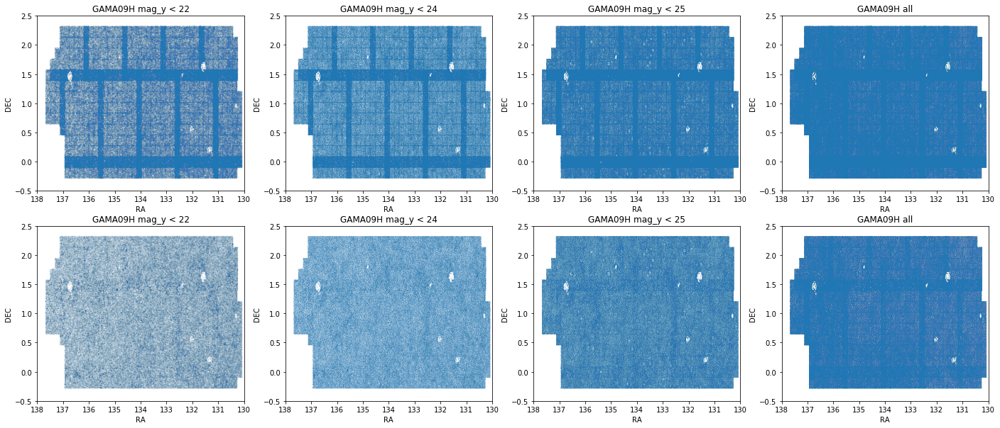

In [7]:
# plot cleaning map
fig, ax = plt.subplots(2,4,figsize=(24,10))

ax[0][0].scatter(df['ra'][df['ymag_psf']<22], df['dec'][df['ymag_psf']<22], s=0.0002)
ax[0][0].set_xlabel('RA')
ax[0][0].set_ylabel('DEC')
ax[0][0].set_title(field + ' mag_y < 22')
ax[0][0].set_xlim([130,138])
ax[0][0].set_ylim([-0.5,2.5])
ax[0][0].invert_xaxis()

ax[0][1].scatter(df['ra'][df['ymag_psf']<24], df['dec'][df['ymag_psf']<24], s=0.0001)
ax[0][1].set_xlabel('RA')
ax[0][1].set_ylabel('DEC')
ax[0][1].set_title(field + ' mag_y < 24')
ax[0][1].set_xlim([130,138])
ax[0][1].set_ylim([-0.5,2.5])
ax[0][1].invert_xaxis()

ax[0][2].scatter(df['ra'][df['ymag_psf']<25], df['dec'][df['ymag_psf']<25], s=0.00005)
ax[0][2].set_xlabel('RA')
ax[0][2].set_ylabel('DEC')
ax[0][2].set_title(field + ' mag_y < 25')
ax[0][2].set_xlim([130,138])
ax[0][2].set_ylim([-0.5,2.5])
ax[0][2].invert_xaxis()

ax[0][3].scatter(df['ra'], df['dec'], s=0.00001)
ax[0][3].set_xlabel('RA')
ax[0][3].set_ylabel('DEC')
ax[0][3].set_title(field + ' all')
ax[0][3].set_xlim([130,138])
ax[0][3].set_ylim([-0.5,2.5])
ax[0][3].invert_xaxis()

ax[1][0].scatter(df_clean['ra'][df_clean['ymag_psf']<22], df_clean['dec'][df_clean['ymag_psf']<22], s=0.0002)
ax[1][0].set_xlabel('RA')
ax[1][0].set_ylabel('DEC')
ax[1][0].set_title(field + ' mag_y < 22')
ax[1][0].set_xlim([130,138])
ax[1][0].set_ylim([-0.5,2.5])
ax[1][0].invert_xaxis()

ax[1][1].scatter(df_clean['ra'][df_clean['ymag_psf']<24], df_clean['dec'][df_clean['ymag_psf']<24], s=0.0001)
ax[1][1].set_xlabel('RA')
ax[1][1].set_ylabel('DEC')
ax[1][1].set_title(field + ' mag_y < 24')
ax[1][1].set_xlim([130,138])
ax[1][1].set_ylim([-0.5,2.5])
ax[1][1].invert_xaxis()

ax[1][2].scatter(df_clean['ra'][df_clean['ymag_psf']<25], df_clean['dec'][df_clean['ymag_psf']<25], s=0.00005)
ax[1][2].set_xlabel('RA')
ax[1][2].set_ylabel('DEC')
ax[1][2].set_title(field + ' mag_y < 25')
ax[1][2].set_xlim([130,138])
ax[1][2].set_ylim([-0.5,2.5])
ax[1][2].invert_xaxis()

ax[1][3].scatter(df_clean['ra'], df_clean['dec'], s=0.00001)
ax[1][3].set_xlabel('RA')
ax[1][3].set_ylabel('DEC')
ax[1][3].set_title(field + ' all')
ax[1][3].set_xlim([130,138])
ax[1][3].set_ylim([-0.5,2.5])
ax[1][3].invert_xaxis()
fig.savefig(field + '_map_clean', dpi = 256, bbox_inches='tight')

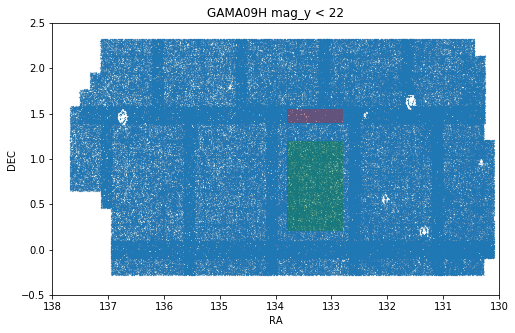

In [9]:
# choose regions for plotting mag func
fig, ax = plt.subplots(1,1,figsize=(8,5))
ax.scatter(df['ra'][df['ymag_psf']<22], df['dec'][df['ymag_psf']<22], s=0.005)
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.set_title(field + ' mag_y < 22')
ax.set_xlim([130,138])
ax.set_ylim([-0.5,2.5])
ax.broken_barh([(132.8,1)],(0.2,1), facecolors='green', alpha=0.3)
ax.broken_barh([(132.8,1)],(1.4,0.15), facecolors='red', alpha=0.3)
ax.invert_xaxis()

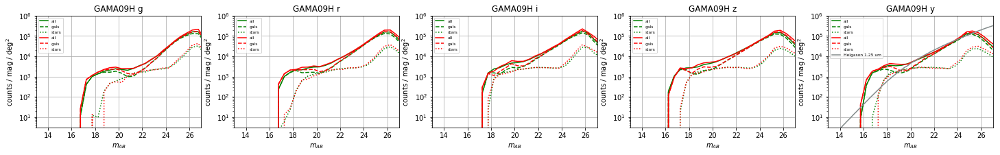

In [10]:
#

df1 = df_clean[(df_clean['ra'] < 133.8) & (df_clean['ra'] > 132.8) \
               & (df_clean['dec'] < 1.2) & (df_clean['dec'] > 0.2)]
df2 = df_clean[(df_clean['ra'] < 133.8) & (df_clean['ra'] > 132.8) \
               & (df_clean['dec'] < 1.55) & (df_clean['dec'] > 1.4)]
area1 = 1 * 1
area2 = 1 * 0.15

binedges = np.arange(7,29,0.5)
bins = (binedges[:-1] + binedges[1:])/2

fig, ax = plt.subplots(1,5,figsize=(25,3))

for iband,band in enumerate(['g','r','i','z','y']):
    d = df1[band + 'mag_psf']
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g-',label='all')
    d = df1[band + 'mag_psf'][df1[band + 'cls']==1]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g--',label='gals')
    d = df1[band + 'mag_psf'][df1[band + 'cls']==0]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g:',label='stars')
    
    d = df2[band + 'mag_psf']
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r-',label='all')
    d = df2[band + 'mag_psf'][df2[band + 'cls']==1]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r--',label='gals')
    d = df2[band + 'mag_psf'][df2[band + 'cls']==0]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r:',label='stars')
    
    if band == 'y':
        helgdir = '/Users/ytcheng/ciber/doc/20170904_External/helgason/'
        helgdat = np.loadtxt(helgdir + 'Helgason125.txt', skiprows=1, delimiter=',')
        ax[iband].plot(helgdat[:,0],helgdat[:,1], '-', c = '#838B8B', label = 'Helgason 1.25 um')

    ax[iband].set_title(field + ' '+ band)
    ax[iband].set_xlim([13,27])
    ax[iband].set_ylim([3e0,1e6])
    ax[iband].set_yscale('log')
    ax[iband].set_xlabel('$m_{AB}$')
    ax[iband].set_ylabel('counts / mag / deg$^2$')
    ax[iband].legend(fontsize=6)
    ax[iband].grid()
fig.savefig(field + '_mfunc_clean', dpi = 256, bbox_inches='tight')

In [11]:
# post-processing

# drop rows with no mag in all bands
sp = np.all(np.isnan(df_clean[['gmag_psf','rmag_psf','imag_psf','zmag_psf','ymag_psf']]),axis=1)
df_clean = df_clean.iloc[~sp]

# set class to NaN if no mag in that band
for band in ['g','r','i','z','y']:
    sp = np.isnan(df_clean[band + 'mag_psf'])
    df_clean[band + 'cls'].iloc[np.where(sp)[0]] = np.nan
    
# get class
cls = np.nanmean(df_clean[['gcls','rcls','icls','zcls','ycls']], axis=1)
cls[cls < 0.5] = -1
cls[cls > 0.5] = 1
cls[cls == 0.5] = 2
df_clean['cls'] = cls

df_clean = get_corrected_mag(df_clean)

#
ra_cent = np.median(df_clean['ra'])
dec_cent = np.median(df_clean['dec'])
thx = (df_clean['ra']-ra_cent)*np.cos(df_clean['dec']*np.pi/180)
thy = df_clean['dec']-dec_cent
df_clean['thx'] = thx
df_clean['thy'] = thy

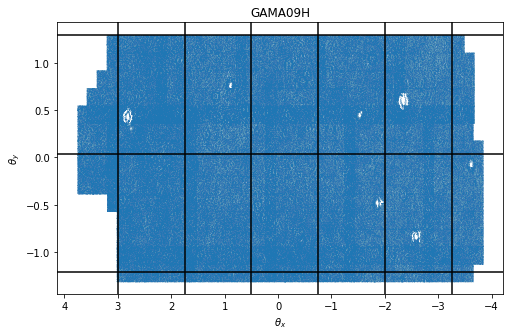

In [25]:
# choose regions for making maps
xmin_all = -3.25
xmax_all = 3
xmin_arr = np.linspace(xmin_all,xmax_all,6)[:-1]
xmax_arr = np.linspace(xmin_all,xmax_all,6)[1:]
ymin_all = -1.21
ymax_all = 1.29
ymin_arr = np.linspace(ymin_all,ymax_all,3)[:-1]
ymax_arr = np.linspace(ymin_all,ymax_all,3)[1:]

fig, ax = plt.subplots(1,1,figsize=(8,5))
ax.scatter(df_clean['thx'], df_clean['thy'], s=0.00005)
ax.set_xlabel(r'$\theta_x$')
ax.set_ylabel(r'$\theta_y$')
ax.set_title(field)
ax.invert_xaxis()
for x in np.linspace(xmin_all,xmax_all,6):
    ax.axvline(x,c='k')
for y in np.linspace(ymin_all,ymax_all,3):
    ax.axhline(y,c='k')   
fig.savefig(field + '_fields', dpi = 256, bbox_inches='tight')

In [26]:
# 
dirname='../../doc/20170617_Stacking/maps/catcoord/HSC/'
for ix,(xmin,xmax) in enumerate(zip(xmin_arr,xmax_arr)):
    for iy,(ymin,ymax) in enumerate(zip(ymin_arr,ymax_arr)):
        x = (df_clean['thx'] - xmin)*3600/7
        y = (df_clean['thy'] - ymin)*3600/7
        df_clean['x'] = x
        df_clean['y'] = y
        npix_x = int(np.floor((xmax-xmin)*3600/7))
        npix_y = int(np.floor((ymax-ymin)*3600/7))
        df_save = df_clean[['ra','dec','x','y','I','H','cls','photz', 'photz_risk', 'specz', 'specz_err']]
        df_save = df_save[(df_save['x']>0) & (df_save['x']<np.floor((xmax-xmin)*3600/7))\
                 &(df_save['y']>0) & (df_save['y']<np.floor((ymax-ymin)*3600/7))]
        df_save.to_csv(dirname + field + '_%d%d.csv'%(ix,iy), index=False, float_format='%.6f')

# D_COSMOS
Don't use, overlap with UD_COSMOS

In [41]:
field = 'D_COSMOS'
df = pd.read_csv(datadir + field + '_raw.csv')
df.rename(columns={"# ra": "ra"}, inplace = True)

In [42]:
# cleaning
df_clean = pd.DataFrame()
ra_lims = np.linspace(min(df['ra']),max(df['ra']),9)
dec_lims = np.linspace(min(df['dec']),max(df['dec']),9)
for ira,(ra1,ra2) in enumerate(zip(ra_lims[:-1],ra_lims[1:])):
    for idec,(dec1,dec2) in enumerate(zip(dec_lims[:-1],dec_lims[1:])):
        print("cleaning region (%d,%d)"%(ira,idec))
        dfs = df[(df['ra']>=ra1) & (df['ra']<ra2) & (df['dec']>=dec1) & (df['dec']<dec2)]
        dfs = clean_hsc(dfs)
        df_clean = df_clean.append(dfs)

cleaning region (0,0)
cleaning df (16826 -> 10888), time = 0.04 min
cleaning region (0,1)
cleaning df (110201 -> 75155), time = 1.65 min
cleaning region (0,2)
cleaning df (150209 -> 90643), time = 1.76 min
cleaning region (0,3)
cleaning df (53087 -> 44119), time = 0.31 min
cleaning region (0,4)
cleaning df (22944 -> 19178), time = 0.09 min
cleaning region (0,5)
cleaning df (105695 -> 72777), time = 1.01 min
cleaning region (0,6)
cleaning df (98946 -> 70818), time = 1.17 min
cleaning region (0,7)
cleaning df (22297 -> 18795), time = 0.08 min
cleaning region (1,0)
cleaning df (62527 -> 49476), time = 0.58 min
cleaning region (1,1)
cleaning df (125346 -> 95350), time = 1.64 min
cleaning region (1,2)
cleaning df (175166 -> 107909), time = 3.18 min
cleaning region (1,3)
cleaning df (112662 -> 92779), time = 1.30 min
cleaning region (1,4)
cleaning df (102350 -> 85807), time = 1.10 min
cleaning region (1,5)
cleaning df (150391 -> 107210), time = 2.36 min
cleaning region (1,6)
cleaning df (135

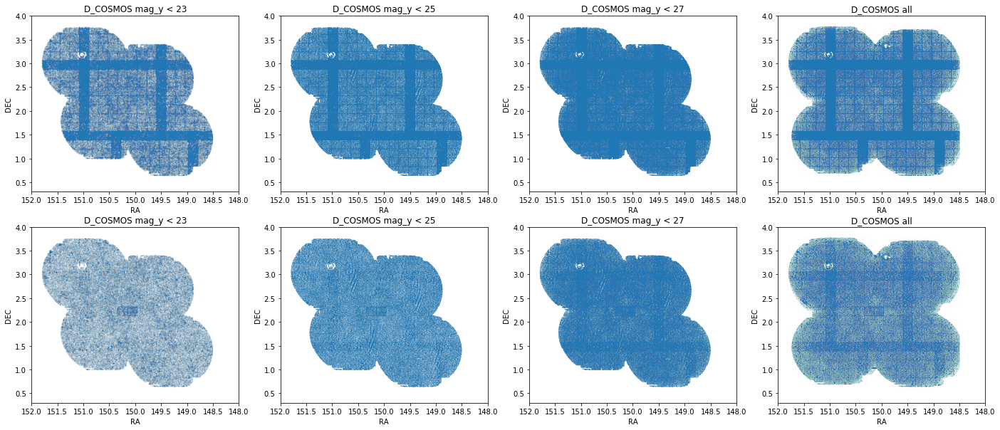

In [43]:
# plot cleaning map
fig, ax = plt.subplots(2,4,figsize=(24,10))

ax[0][0].scatter(df['ra'][df['ymag_psf']<23], df['dec'][df['ymag_psf']<23], s=0.0002)
ax[0][0].set_xlabel('RA')
ax[0][0].set_ylabel('DEC')
ax[0][0].set_title(field + ' mag_y < 23')
ax[0][0].set_xlim([148,152])
ax[0][0].set_ylim([0.3,4])
ax[0][0].invert_xaxis()

ax[0][1].scatter(df['ra'][df['ymag_psf']<25], df['dec'][df['ymag_psf']<25], s=0.0001)
ax[0][1].set_xlabel('RA')
ax[0][1].set_ylabel('DEC')
ax[0][1].set_title(field + ' mag_y < 25')
ax[0][1].set_xlim([148,152])
ax[0][1].set_ylim([0.3,4])
ax[0][1].invert_xaxis()

ax[0][2].scatter(df['ra'][df['ymag_psf']<27], df['dec'][df['ymag_psf']<27], s=0.00005)
ax[0][2].set_xlabel('RA')
ax[0][2].set_ylabel('DEC')
ax[0][2].set_title(field + ' mag_y < 27')
ax[0][2].set_xlim([148,152])
ax[0][2].set_ylim([0.3,4])
ax[0][2].invert_xaxis()

ax[0][3].scatter(df['ra'], df['dec'], s=0.00001)
ax[0][3].set_xlabel('RA')
ax[0][3].set_ylabel('DEC')
ax[0][3].set_title(field + ' all')
ax[0][3].set_xlim([148,152])
ax[0][3].set_ylim([0.3,4])
ax[0][3].invert_xaxis()

ax[1][0].scatter(df_clean['ra'][df_clean['ymag_psf']<23], df_clean['dec'][df_clean['ymag_psf']<23], s=0.0002)
ax[1][0].set_xlabel('RA')
ax[1][0].set_ylabel('DEC')
ax[1][0].set_title(field + ' mag_y < 23')
ax[1][0].set_xlim([148,152])
ax[1][0].set_ylim([0.3,4])
ax[1][0].invert_xaxis()

ax[1][1].scatter(df_clean['ra'][df_clean['ymag_psf']<25], df_clean['dec'][df_clean['ymag_psf']<25], s=0.0001)
ax[1][1].set_xlabel('RA')
ax[1][1].set_ylabel('DEC')
ax[1][1].set_title(field + ' mag_y < 25')
ax[1][1].set_xlim([148,152])
ax[1][1].set_ylim([0.3,4])
ax[1][1].invert_xaxis()

ax[1][2].scatter(df_clean['ra'][df_clean['ymag_psf']<27], df_clean['dec'][df_clean['ymag_psf']<27], s=0.00005)
ax[1][2].set_xlabel('RA')
ax[1][2].set_ylabel('DEC')
ax[1][2].set_title(field + ' mag_y < 27')
ax[1][2].set_xlim([148,152])
ax[1][2].set_ylim([0.3,4])
ax[1][2].invert_xaxis()

ax[1][3].scatter(df_clean['ra'], df_clean['dec'], s=0.00001)
ax[1][3].set_xlabel('RA')
ax[1][3].set_ylabel('DEC')
ax[1][3].set_title(field + ' all')
ax[1][3].set_xlim([148,152])
ax[1][3].set_ylim([0.3,4])
ax[1][3].invert_xaxis()
fig.savefig(field + '_map_clean', dpi = 256, bbox_inches='tight')

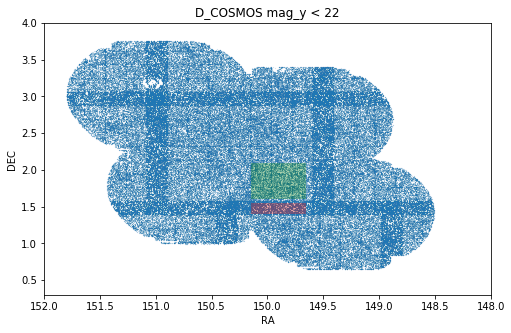

In [44]:
# choose regions for plotting mag func
fig, ax = plt.subplots(1,1,figsize=(8,5))
ax.scatter(df['ra'][df['ymag_psf']<22], df['dec'][df['ymag_psf']<22], s=0.005)
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.set_title(field + ' mag_y < 22')
ax.set_xlim([148,152])
ax.set_ylim([0.3,4])
ax.broken_barh([(149.65,0.5)],(1.6,0.5), facecolors='green', alpha=0.3)
ax.broken_barh([(149.65,0.5)],(1.4,0.15), facecolors='red', alpha=0.3)
ax.invert_xaxis()

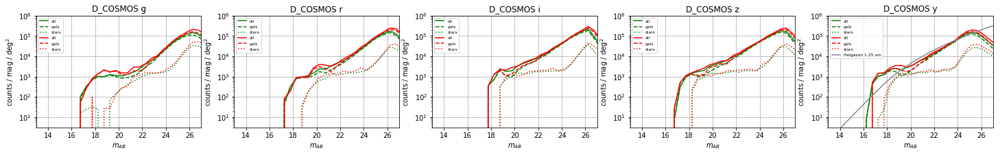

In [45]:
#

df1 = df_clean[(df_clean['ra'] < 150.15) & (df_clean['ra'] > 149.65) \
               & (df_clean['dec'] < 2.1) & (df_clean['dec'] > 1.6)]
df2 = df_clean[(df_clean['ra'] < 150.15) & (df_clean['ra'] > 149.65) \
               & (df_clean['dec'] < 1.55) & (df_clean['dec'] > 1.4)]
area1 = 0.5 * 0.5
area2 = 0.5 * 0.15

binedges = np.arange(7,29,0.5)
bins = (binedges[:-1] + binedges[1:])/2

fig, ax = plt.subplots(1,5,figsize=(25,3))

for iband,band in enumerate(['g','r','i','z','y']):
    d = df1[band + 'mag_psf']
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g-',label='all')
    d = df1[band + 'mag_psf'][df1[band + 'cls']==1]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g--',label='gals')
    d = df1[band + 'mag_psf'][df1[band + 'cls']==0]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g:',label='stars')
    
    d = df2[band + 'mag_psf']
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r-',label='all')
    d = df2[band + 'mag_psf'][df2[band + 'cls']==1]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r--',label='gals')
    d = df2[band + 'mag_psf'][df2[band + 'cls']==0]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r:',label='stars')
    
    if band == 'y':
        helgdir = '/Users/ytcheng/ciber/doc/20170904_External/helgason/'
        helgdat = np.loadtxt(helgdir + 'Helgason125.txt', skiprows=1, delimiter=',')
        ax[iband].plot(helgdat[:,0],helgdat[:,1], '-', c = '#838B8B', label = 'Helgason 1.25 um')

    ax[iband].set_title(field + ' '+ band)
    ax[iband].set_xlim([13,27])
    ax[iband].set_ylim([3e0,1e6])
    ax[iband].set_yscale('log')
    ax[iband].set_xlabel('$m_{AB}$')
    ax[iband].set_ylabel('counts / mag / deg$^2$')
    ax[iband].legend(fontsize=6)
    ax[iband].grid()
fig.savefig(field + '_mfunc_clean', dpi = 256, bbox_inches='tight')

In [46]:
# post-processing

# drop rows with no mag in all bands
sp = np.all(np.isnan(df_clean[['gmag_psf','rmag_psf','imag_psf','zmag_psf','ymag_psf']]),axis=1)
df_clean = df_clean.iloc[~sp]

# set class to NaN if no mag in that band
for band in ['g','r','i','z','y']:
    sp = np.isnan(df_clean[band + 'mag_psf'])
    df_clean[band + 'cls'].iloc[np.where(sp)[0]] = np.nan
    
# get class
cls = np.nanmean(df_clean[['gcls','rcls','icls','zcls','ycls']], axis=1)
cls[cls < 0.5] = -1
cls[cls > 0.5] = 1
cls[cls == 0.5] = 2
df_clean['cls'] = cls

df_clean = get_corrected_mag(df_clean)

#
ra_cent = np.median(df_clean['ra'])
dec_cent = np.median(df_clean['dec'])
thx = (df_clean['ra']-ra_cent)*np.cos(df_clean['dec']*np.pi/180)
thy = df_clean['dec']-dec_cent
df_clean['thx'] = thx
df_clean['thy'] = thy

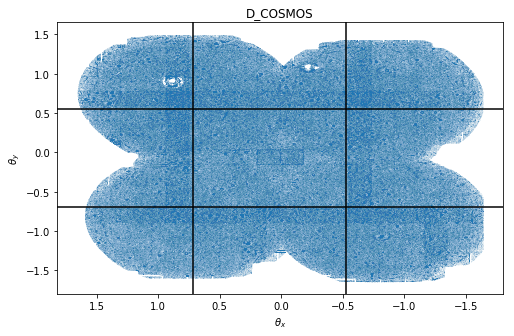

In [47]:
# choose regions for making maps
xmin = -0.53
xmax = 0.72
ymin = -0.7
ymax = 0.55

fig, ax = plt.subplots(1,1,figsize=(8,5))
ax.scatter(df_clean['thx'], df_clean['thy'], s=0.00005)
ax.set_xlabel(r'$\theta_x$')
ax.set_ylabel(r'$\theta_y$')
ax.set_title(field)
ax.invert_xaxis()
ax.axvline(xmin,c='k')
ax.axvline(xmax,c='k')
ax.axhline(ymin,c='k')
ax.axhline(ymax,c='k')
fig.savefig(field + '_fields', dpi = 256, bbox_inches='tight')

# UD_SXDS
Don't use, too many holes

In [50]:
field = 'UD_SXDS'
df = pd.read_csv(datadir + field + '_raw.csv')
df.rename(columns={"# ra": "ra"}, inplace = True)

In [51]:
# cleaning
df_clean = pd.DataFrame()
ra_lims = np.linspace(min(df['ra']),max(df['ra']),9)
dec_lims = np.linspace(min(df['dec']),max(df['dec']),9)
for ira,(ra1,ra2) in enumerate(zip(ra_lims[:-1],ra_lims[1:])):
    for idec,(dec1,dec2) in enumerate(zip(dec_lims[:-1],dec_lims[1:])):
        print("cleaning region (%d,%d)"%(ira,idec))
        dfs = df[(df['ra']>=ra1) & (df['ra']<ra2) & (df['dec']>=dec1) & (df['dec']<dec2)]
        dfs = clean_hsc(dfs)
        df_clean = df_clean.append(dfs)

cleaning region (0,0)
cleaning df (0 -> 0), time = 0.00 min
cleaning region (0,1)
cleaning df (449 -> 424), time = 0.00 min
cleaning region (0,2)
cleaning df (12761 -> 11021), time = 0.04 min
cleaning region (0,3)
cleaning df (27207 -> 23024), time = 0.11 min
cleaning region (0,4)
cleaning df (33830 -> 28036), time = 0.15 min
cleaning region (0,5)
cleaning df (34188 -> 24997), time = 0.14 min
cleaning region (0,6)
cleaning df (13555 -> 8950), time = 0.03 min
cleaning region (0,7)
cleaning df (73 -> 73), time = 0.00 min
cleaning region (1,0)
cleaning df (59 -> 55), time = 0.00 min
cleaning region (1,1)
cleaning df (13109 -> 11444), time = 0.04 min
cleaning region (1,2)
cleaning df (39849 -> 33881), time = 0.20 min
cleaning region (1,3)
cleaning df (45883 -> 38911), time = 0.25 min
cleaning region (1,4)
cleaning df (49651 -> 41117), time = 0.27 min
cleaning region (1,5)
cleaning df (61515 -> 40558), time = 0.39 min
cleaning region (1,6)
cleaning df (56405 -> 35893), time = 0.24 min
clean

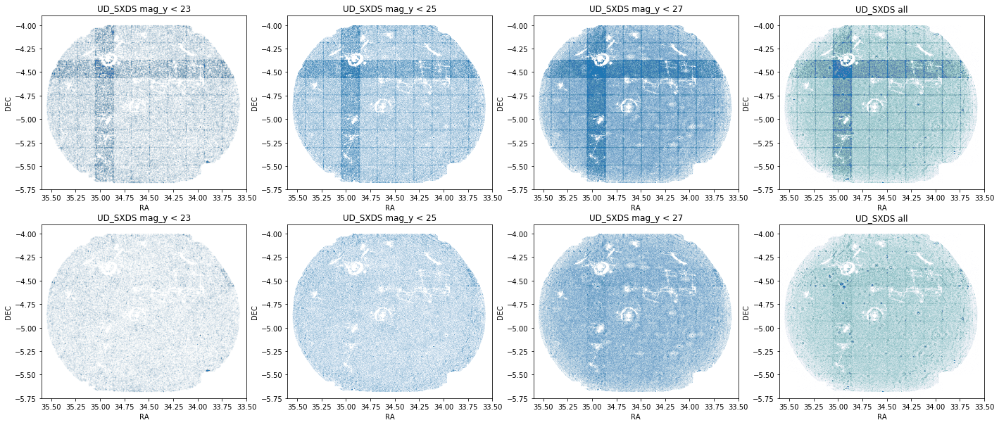

In [52]:
# plot cleaning map
fig, ax = plt.subplots(2,4,figsize=(24,10))

ax[0][0].scatter(df['ra'][df['ymag_psf']<23], df['dec'][df['ymag_psf']<23], s=0.0002)
ax[0][0].set_xlabel('RA')
ax[0][0].set_ylabel('DEC')
ax[0][0].set_title(field + ' mag_y < 23')
ax[0][0].set_xlim([33.5,35.6])
ax[0][0].set_ylim([-5.75,-3.9])
ax[0][0].invert_xaxis()

ax[0][1].scatter(df['ra'][df['ymag_psf']<25], df['dec'][df['ymag_psf']<25], s=0.0001)
ax[0][1].set_xlabel('RA')
ax[0][1].set_ylabel('DEC')
ax[0][1].set_title(field + ' mag_y < 25')
ax[0][1].set_xlim([33.5,35.6])
ax[0][1].set_ylim([-5.75,-3.9])
ax[0][1].invert_xaxis()

ax[0][2].scatter(df['ra'][df['ymag_psf']<27], df['dec'][df['ymag_psf']<27], s=0.00005)
ax[0][2].set_xlabel('RA')
ax[0][2].set_ylabel('DEC')
ax[0][2].set_title(field + ' mag_y < 27')
ax[0][2].set_xlim([33.5,35.6])
ax[0][2].set_ylim([-5.75,-3.9])
ax[0][2].invert_xaxis()

ax[0][3].scatter(df['ra'], df['dec'], s=0.00001)
ax[0][3].set_xlabel('RA')
ax[0][3].set_ylabel('DEC')
ax[0][3].set_title(field + ' all')
ax[0][3].set_xlim([33.5,35.6])
ax[0][3].set_ylim([-5.75,-3.9])
ax[0][3].invert_xaxis()

ax[1][0].scatter(df_clean['ra'][df_clean['ymag_psf']<23], df_clean['dec'][df_clean['ymag_psf']<23], s=0.0002)
ax[1][0].set_xlabel('RA')
ax[1][0].set_ylabel('DEC')
ax[1][0].set_title(field + ' mag_y < 23')
ax[1][0].set_xlim([33.5,35.6])
ax[1][0].set_ylim([-5.75,-3.9])
ax[1][0].invert_xaxis()

ax[1][1].scatter(df_clean['ra'][df_clean['ymag_psf']<25], df_clean['dec'][df_clean['ymag_psf']<25], s=0.0001)
ax[1][1].set_xlabel('RA')
ax[1][1].set_ylabel('DEC')
ax[1][1].set_title(field + ' mag_y < 25')
ax[1][1].set_xlim([33.5,35.6])
ax[1][1].set_ylim([-5.75,-3.9])
ax[1][1].invert_xaxis()

ax[1][2].scatter(df_clean['ra'][df_clean['ymag_psf']<27], df_clean['dec'][df_clean['ymag_psf']<27], s=0.00005)
ax[1][2].set_xlabel('RA')
ax[1][2].set_ylabel('DEC')
ax[1][2].set_title(field + ' mag_y < 27')
ax[1][2].set_xlim([33.5,35.6])
ax[1][2].set_ylim([-5.75,-3.9])
ax[1][2].invert_xaxis()

ax[1][3].scatter(df_clean['ra'], df_clean['dec'], s=0.00001)
ax[1][3].set_xlabel('RA')
ax[1][3].set_ylabel('DEC')
ax[1][3].set_title(field + ' all')
ax[1][3].set_xlim([33.5,35.6])
ax[1][3].set_ylim([-5.75,-3.9])
ax[1][3].invert_xaxis()
fig.savefig(field + '_map_clean', dpi = 256, bbox_inches='tight')

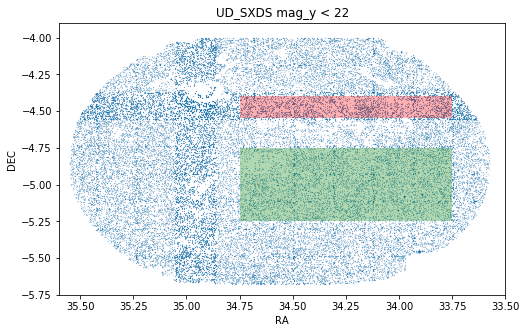

In [53]:
# choose regions for plotting mag func
fig, ax = plt.subplots(1,1,figsize=(8,5))
ax.scatter(df['ra'][df['ymag_psf']<22], df['dec'][df['ymag_psf']<22], s=0.005)
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.set_title(field + ' mag_y < 22')
ax.set_xlim([33.5,35.6])
ax.set_ylim([-5.75,-3.9])
ax.broken_barh([(33.75,1)],(-5.25,0.5), facecolors='green', alpha=0.3)
ax.broken_barh([(33.75,1)],(-4.55,0.15), facecolors='red', alpha=0.3)
ax.invert_xaxis()

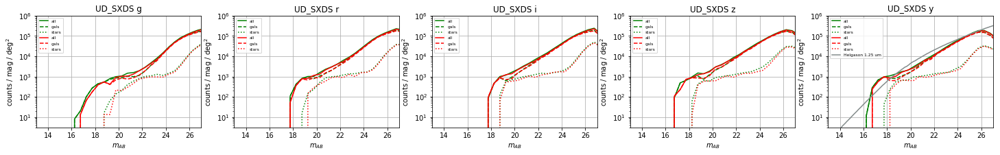

In [54]:
# mag func
df1 = df_clean[(df_clean['ra'] < 34.75) & (df_clean['ra'] > 33.75) \
               & (df_clean['dec'] < -4.75) & (df_clean['dec'] > -5.25)]
df2 = df_clean[(df_clean['ra'] < 34.75) & (df_clean['ra'] > 33.75) \
               & (df_clean['dec'] < -4.55) & (df_clean['dec'] > -4.70)]
area1 = 1 * 0.5
area2 = 1 * 0.15

binedges = np.arange(7,29,0.5)
bins = (binedges[:-1] + binedges[1:])/2

fig, ax = plt.subplots(1,5,figsize=(25,3))

for iband,band in enumerate(['g','r','i','z','y']):
    d = df1[band + 'mag_psf']
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g-',label='all')
    d = df1[band + 'mag_psf'][df1[band + 'cls']==1]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g--',label='gals')
    d = df1[band + 'mag_psf'][df1[band + 'cls']==0]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area1,'g:',label='stars')
    
    d = df2[band + 'mag_psf']
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r-',label='all')
    d = df2[band + 'mag_psf'][df2[band + 'cls']==1]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r--',label='gals')
    d = df2[band + 'mag_psf'][df2[band + 'cls']==0]
    d = d[(~np.isnan(d)) & (np.isfinite(d))]
    shist,_ = np.histogram(d, bins = binedges)
    ax[iband].plot(bins,shist / (binedges[1]-binedges[0]) / area2,'r:',label='stars')
    
    if band == 'y':
        helgdir = '/Users/ytcheng/ciber/doc/20170904_External/helgason/'
        helgdat = np.loadtxt(helgdir + 'Helgason125.txt', skiprows=1, delimiter=',')
        ax[iband].plot(helgdat[:,0],helgdat[:,1], '-', c = '#838B8B', label = 'Helgason 1.25 um')

    ax[iband].set_title(field + ' '+ band)
    ax[iband].set_xlim([13,27])
    ax[iband].set_ylim([3e0,1e6])
    ax[iband].set_yscale('log')
    ax[iband].set_xlabel('$m_{AB}$')
    ax[iband].set_ylabel('counts / mag / deg$^2$')
    ax[iband].legend(fontsize=6)
    ax[iband].grid()
fig.savefig(field + '_mfunc_clean', dpi = 256, bbox_inches='tight')